In [2]:
import pandas as pd
import networkx as nx
import numpy as np
from mpl_toolkits.basemap import Basemap
import matplotlib.pyplot as plt
from heat_kernel_func import *
%load_ext autoreload
%autoreload 2

In [3]:
man_lu5 = pd.read_csv('lu5_utm.csv')

In [4]:
m = Basemap(
        projection='merc',
        llcrnrlon=-74.05,
        llcrnrlat=40.70,
        urcrnrlon=-73.90,
        urcrnrlat=40.88,
        lat_ts=0,
        resolution='h',
        suppress_ticks=True)

/usr/local/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:611: MatplotlibDeprecationWarning: isinstance(..., numbers.Number)
  if cb.is_numlike(alpha):


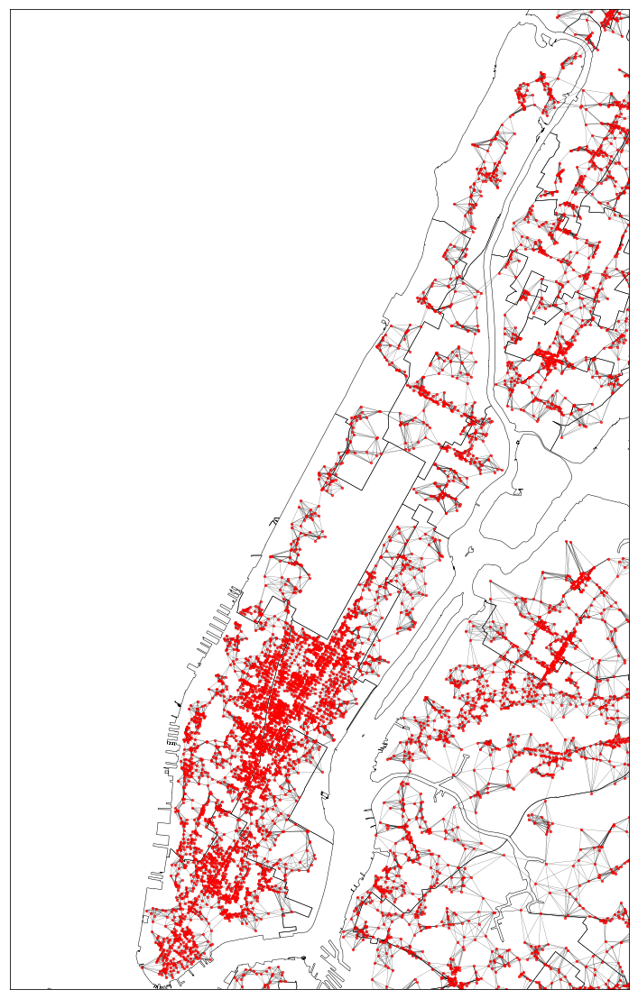

In [8]:
plt.figure(figsize=(20, 20))

m.readshapefile('../pluto/shapefiles/nycc', 'nyc-council')
positions = {i: m(pair[1], pair[2]) 
             for i, pair in enumerate(man_lu5[['lon', 'lat']].itertuples())}

nx.draw_networkx(weighted_G, positions, node_size=5, with_labels=False, alpha=.7, width=.25)

In [6]:
def k_neighbors(points, weighted=1, k=3):
    '''
    weights are 1 / distance
    returns a weighted edgelist
    '''
    num_points = points.shape[0]
    
    # expanded out form of distance formula
    squared = (points ** 2).sum(axis=1, keepdims=True)
    mixed = points @ points.T
    dists = np.sqrt(squared + squared.T - (2 * mixed))

    closest_idx = np.argsort(dists, axis=1)[:, 1:(k + 1)]
    
    edge_list = []
    for i in range(num_points): # this can probably be parallelized
        cdists = dists[i, closest_idx[i]]
        if weighted == 1:
            edge_list.extend([(i, j, 1 / cdists[k]) 
                              for k, j in enumerate(closest_idx[i])])
        elif weighted == 2:
            edge_list.extend([(i, j, cdists[k]) 
                              for k, j in enumerate(closest_idx[i])])
        else:
            edge_list.extend([(i, j, 1) 
                              for k, j in enumerate(closest_idx[i])])

    
    del dists
    del closest_idx
    
    return edge_list

## Weighted (Inverse Distance)

In [7]:
weighted_edge_list = k_neighbors(man_lu5.loc[man_lu5.BoroCode != 5, 
                                             ['utm18_x', 'utm18_y']].values, k=8)
weighted_G = nx.Graph()
weighted_G.add_weighted_edges_from(weighted_edge_list)
print(nx.number_connected_components(weighted_G))

/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:12: RuntimeWarning: invalid value encountered in sqrt
  if sys.path[0] == '':


25


In [9]:
weighted_hks_dict = {}
ts = [1e-8, 1e-7, 1e-6, 1e-5, .0001, .001, .01, .1, 1, 10]

weighted_hks_dict = hks_s(weighted_G, ts, list(weighted_G.nodes()), verbose=True, k=2000,
                          eigen_save_loc='eigen_saves/man_lu5_weigted_pluto_knn')


Loading eigen values/vectors from file...
done! (0.03s)
Done with time 1e-08...
Done with time 1e-07...
Done with time 1e-06...
Done with time 1e-05...
Done with time 0.0001...
Done with time 0.001...
Done with time 0.01...
Done with time 0.1...
Done with time 1...
Done with time 10...
Finished in 3.39 seconds


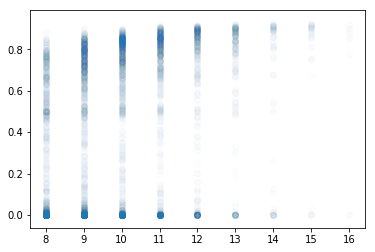

In [10]:
plt.scatter(*zip(*[(nx.degree(weighted_G, node), hks) 
                   for node, hks in weighted_hks_dict[1e-5].items()]), alpha=.01)

0.9259445479443786 0.4392708091228067 1.713729025160342e-15
0.9259444920713416 0.43927079713625905 1.7137289943773246e-15
0.9259439333411663 0.4392706772708041 1.713728686547183e-15
0.9259383460588302 0.43926947861830595 1.7137256082488845e-15
0.9259445479443786 0.4392708091228067 1.713729025160342e-15
0.9259444920713416 0.43927079713625905 1.7137289943773246e-15
0.9259439333411663 0.4392706772708041 1.713728686547183e-15
0.9259383460588302 0.43926947861830595 1.7137256082488845e-15
0.9258824751772842 0.4392574922984655 1.7136948255779055e-15
0.9253239604965596 0.43913764961145724 1.7133870300664469e-15
0.9202994958256896 0.4379412711449073 1.710312192582097e-15
0.8893558025900979 0.42617962221420713 1.679873390262351e-15
0.7279998770575372 0.3263566197300325 1.4043683592224861e-15
0.12796432681059944 0.031427474389334235 2.4193656234829995e-16


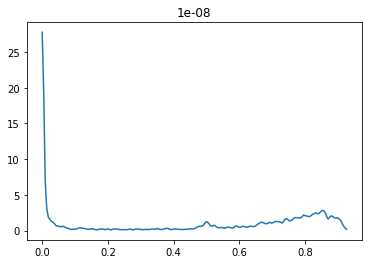

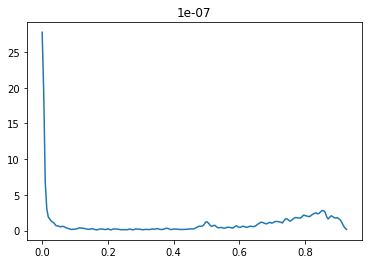

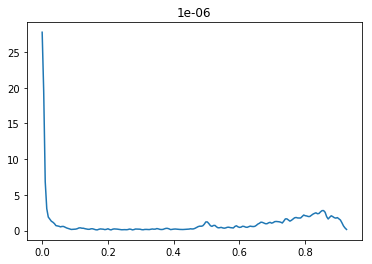

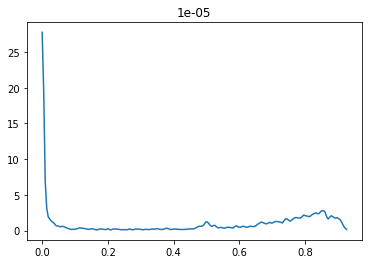

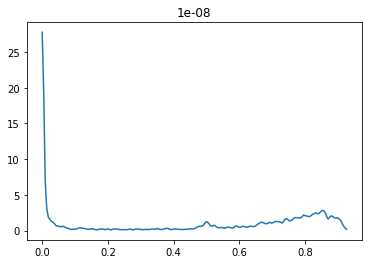

...

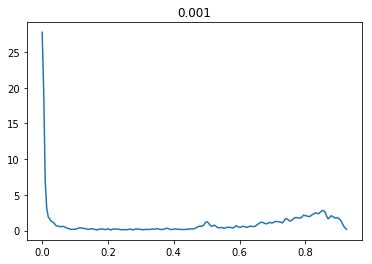

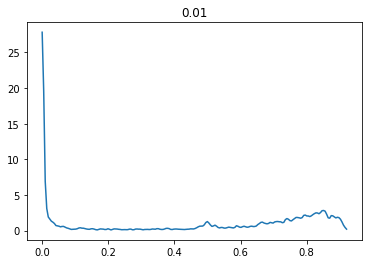

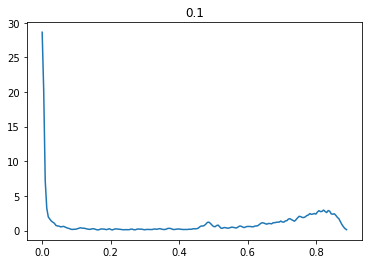

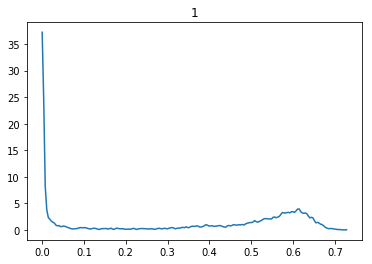

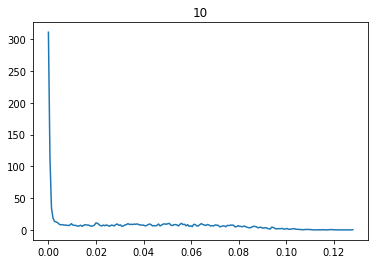

In [11]:
from scipy.stats import gaussian_kde
for t in [1e-8, 1e-7, 1e-6, 1e-5] + ts:
    v = weighted_hks_dict[t]
    plt.figure()
    ax = plt.axes()
    density = gaussian_kde(list(v.values()))
    xs = np.linspace(max(v.values()), min(v.values()),200)
    density.covariance_factor = lambda : .01
    density._compute_covariance()
    plt.plot(xs, density(xs))
    plt.title(t)
    print(max(v.values()), np.mean(list(v.values())), min(v.values()))

In [13]:
def compare_to_node_s(G, positions, hks_dict, node, ts=[1e-6, 1e-5, .0001, .001, .01]):
    plt.figure(figsize=(10, 10))
    m.readshapefile('../pluto/shapefiles/nycc', 'nyc-council')
    plt.scatter(*positions[node])
    
    for t in ts:
        node_hks = hks_dict[t][node]
        colors = np.array([abs(other_hks - node_hks) for i, other_hks in hks_dict[t].items()])
        log_colors = np.log(colors + 1)
        print(min(colors), np.mean(colors), max(colors))
        print(min(log_colors), np.mean(log_colors), max(log_colors))
        print()
        
#         plt.figure()
#         plt.hist(np.sort(colors))
        cmap = matplotlib.cm.viridis_r
        plt.figure(figsize=(15, 15))
        plt.title(t)
        m.readshapefile('../pluto/shapefiles/nycc', 'nyc-council')
        positions = {i: m(pair[1], pair[2]) 
                     for i, pair in enumerate(man_lu5[['lon', 'lat']].itertuples())}
        nx.draw(G, positions, node_color=log_colors, cmap=cmap, node_size=3, 
                with_labels=False, alpha=.7, width=.25)

0.0 0.43927030405188777 0.925944000732742
0.0 0.32932599530671064 0.6554162375289063

0.0 0.43927029206535007 0.9259439448597155
0.0 0.32932598848375244 0.6554162085181836

0.0 0.4392701721999931 0.9259433861296463
0.0 0.3293259202541759 0.6554159184110121

0.0 0.43926897354847577 0.9259377988483714
0.0 0.3293252379590746 0.6554130173447503

0.0 0.4392569872384435 0.9258819279774361
0.0 0.32931841507437837 0.6553840072275063

0.0 0.43913714464950526 0.9253234134028077
0.0 0.3292501928589889 0.6550939605906558

0.0 0.43794076716257724 0.9202989497917342
0.0 0.32856863370161965 0.6524808769357618

0.0 0.4261791279211221 0.8893552670385976
0.0 0.32181917732381965 0.6362356423229647

0.0 0.3263562124045544 0.7279994356118572
0.0 0.26073947915501605 0.546964343768302

0.0 0.031427412512798326 0.1279642594472449
0.0 0.030502070145508157 0.12041446768669635



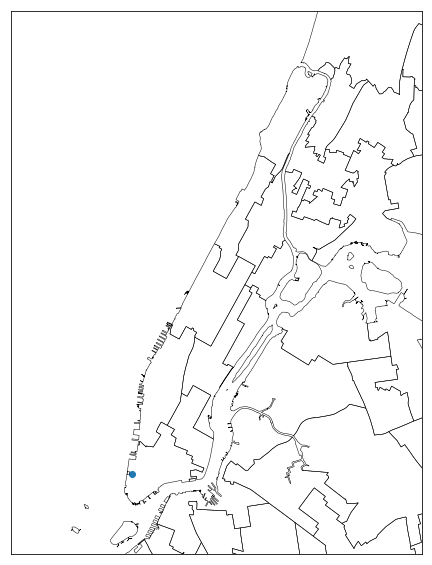

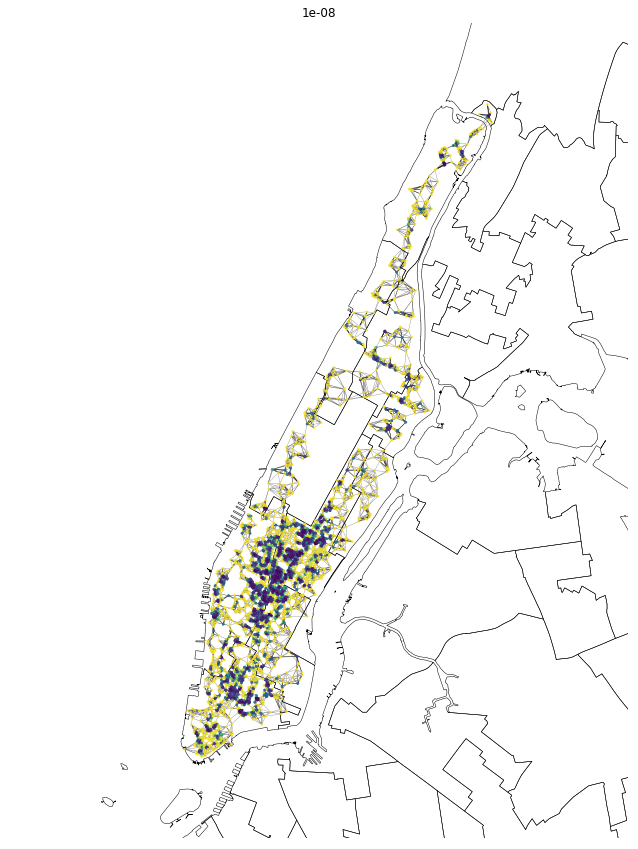

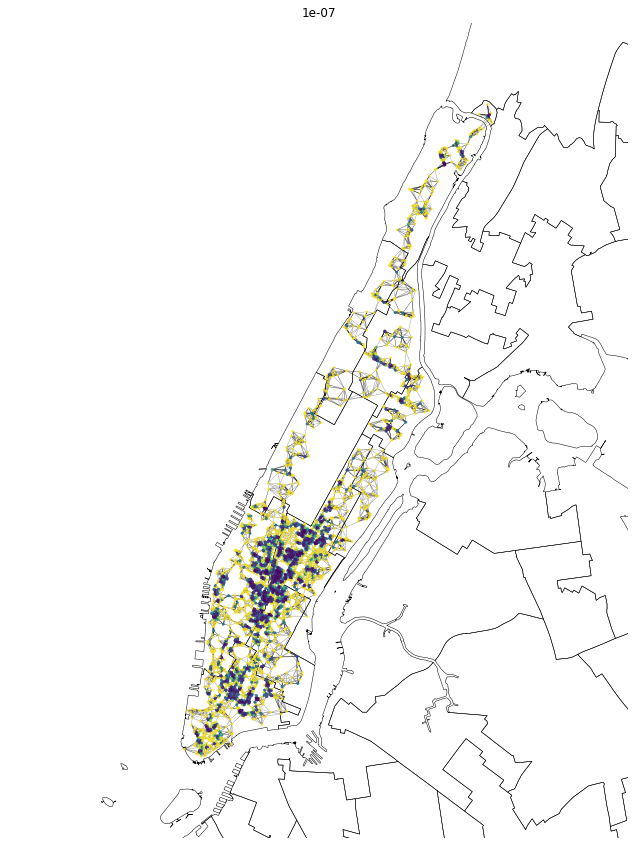

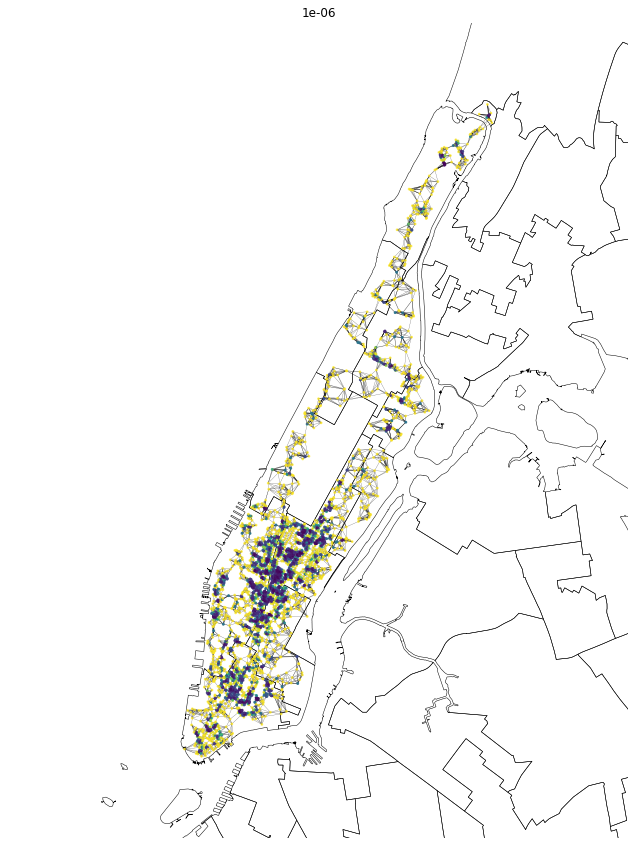

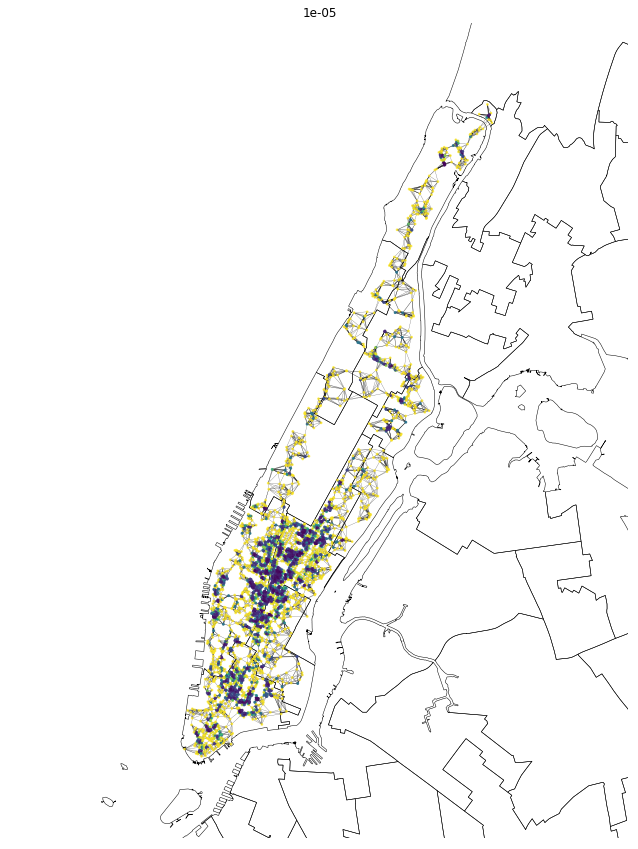

...

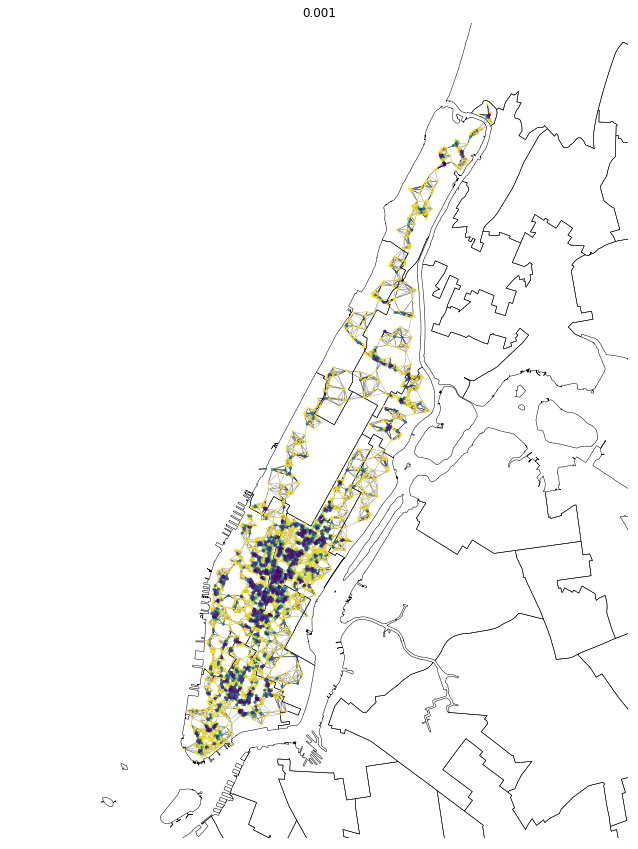

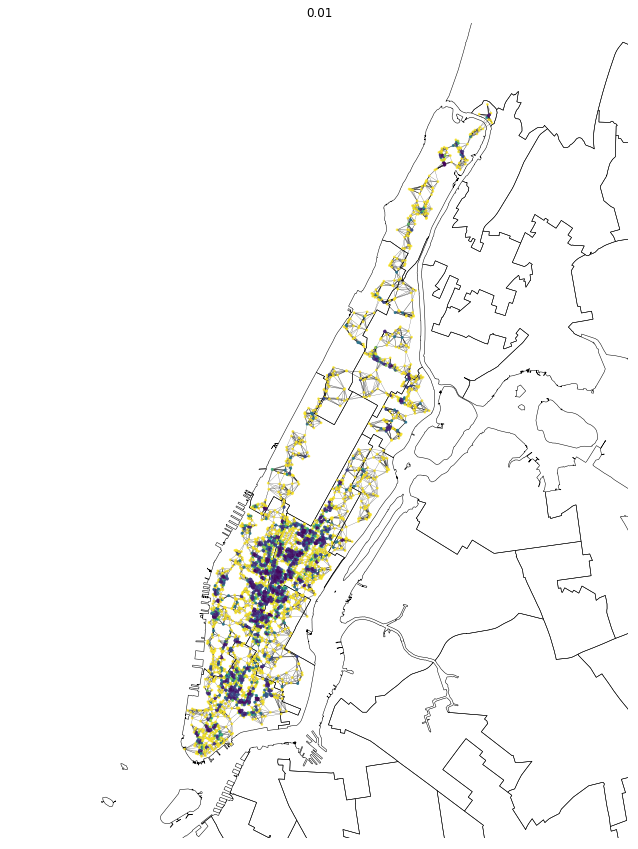

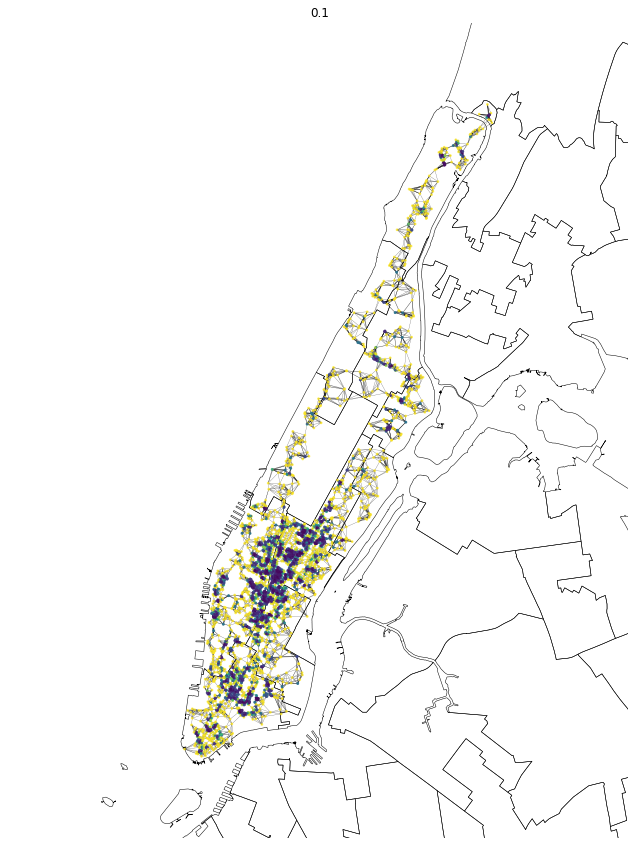

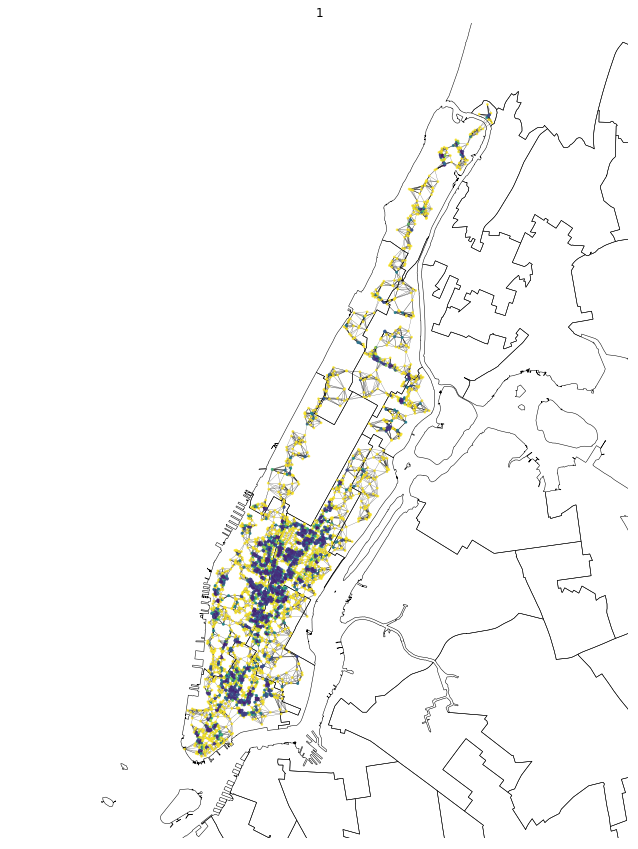

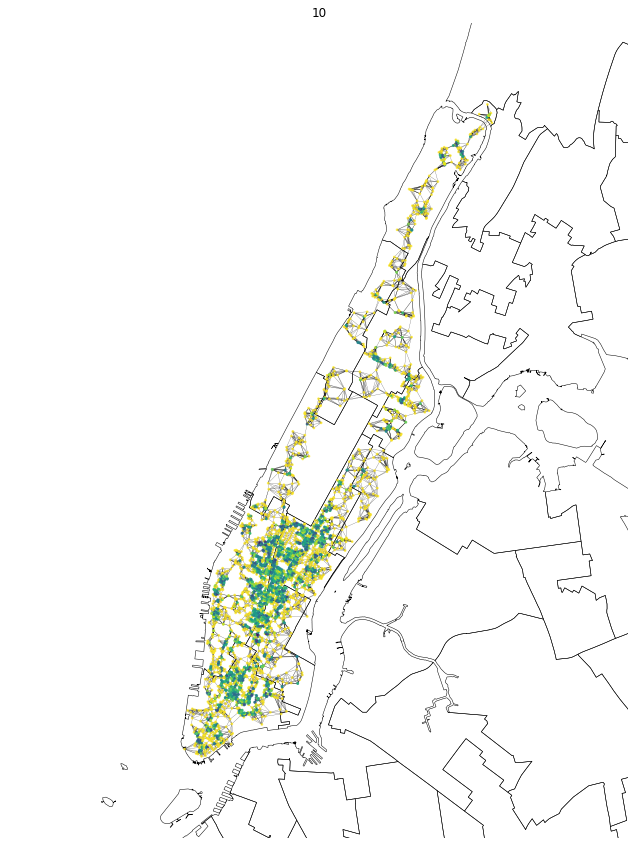

In [14]:
compare_to_node_s(weighted_G, positions, weighted_hks_dict, 26, ts=ts)

## Weighted (Distance)

In [73]:
rweighted_edge_list = k_neighbors(man_lu5.loc[man_lu5.BoroCode != 5, 
                                             ['utm18_x', 'utm18_y']].values,
                                 weighted=2, k=8)
rweighted_G = nx.Graph()
rweighted_G.add_weighted_edges_from(rweighted_edge_list)
print(nx.number_connected_components(rweighted_G))

/home/ubuntu/anaconda3/envs/mainEnv/lib/python3.6/site-packages/ipykernel_launcher.py:12: RuntimeWarning: invalid value encountered in sqrt
  if sys.path[0] == '':


1


In [74]:
rweighted_hks_dict = {}
ts = [1e-8, 1e-7, 1e-6, 1e-5, .0001, .001, .01, .1, 1, 10]

rweighted_hks_dict = hks_s(rweighted_G, ts, list(rweighted_G.nodes()), verbose=True, k=2000,
                           eigen_save_loc='eigen_saves/man_lu5_rweigted_pluto_knn')

Calculating eigen values/vectors...
done! (172.02s)
Done with time 1e-08...
Done with time 1e-07...
Done with time 1e-06...
Done with time 1e-05...
Done with time 0.0001...
Done with time 0.001...
Done with time 0.01...
Done with time 0.1...
Done with time 1...
Done with time 10...
Finished in 175.33 seconds


0.0 0.47134415266296265 0.9056282903540324
0.0 0.35261675422990774 0.6448117654123687

0.0 0.47121056283204266 0.9054323854896189
0.0 0.3525318110641717 0.6447089568342593

0.0 0.4698779203683924 0.9034757401540024
0.0 0.35168450003886215 0.6436815518965783

0.0 0.45689525738989634 0.8841475937853337
0.0 0.3434432767281223 0.6334755137360923

0.0 0.3585468981820281 0.7127979931266298
0.0 0.2828347487784249 0.5381282866010509

0.0 0.0912421782962074 0.2843211708709559
0.0 0.08613768603360467 0.2502303070667754

0.0 1.8290224525419456e-05 0.00020347265205645056
0.0 1.828976772498438e-05 0.0002034519543040604

0.0 2.8503611991660014e-38 1.5628935117919824e-36
0.0 0.0 0.0

0.0 0.0 0.0
0.0 0.0 0.0

0.0 0.0 0.0
0.0 0.0 0.0



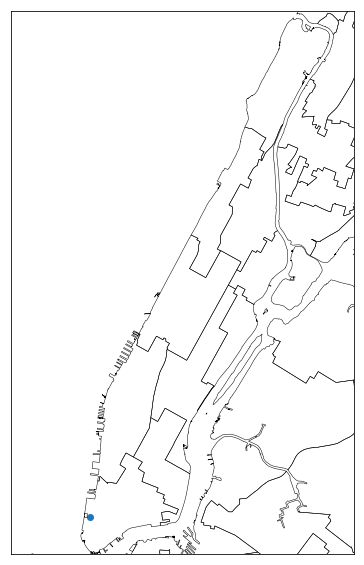

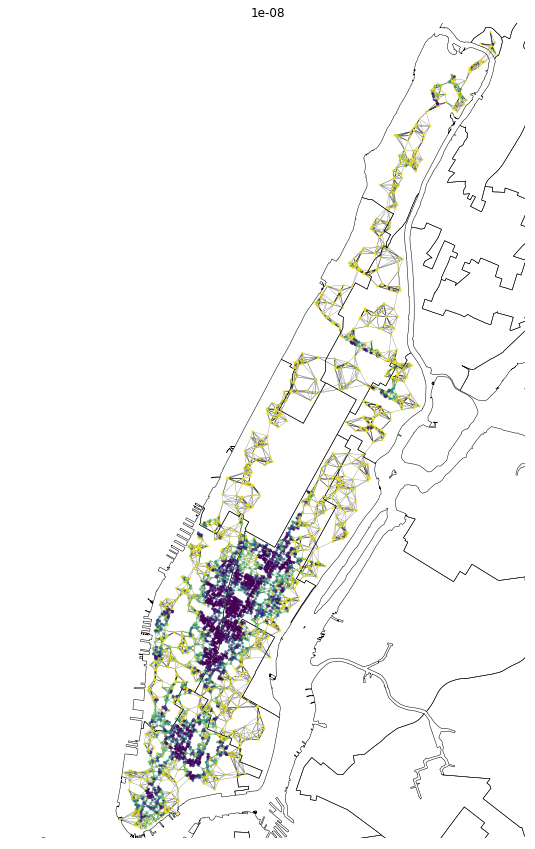

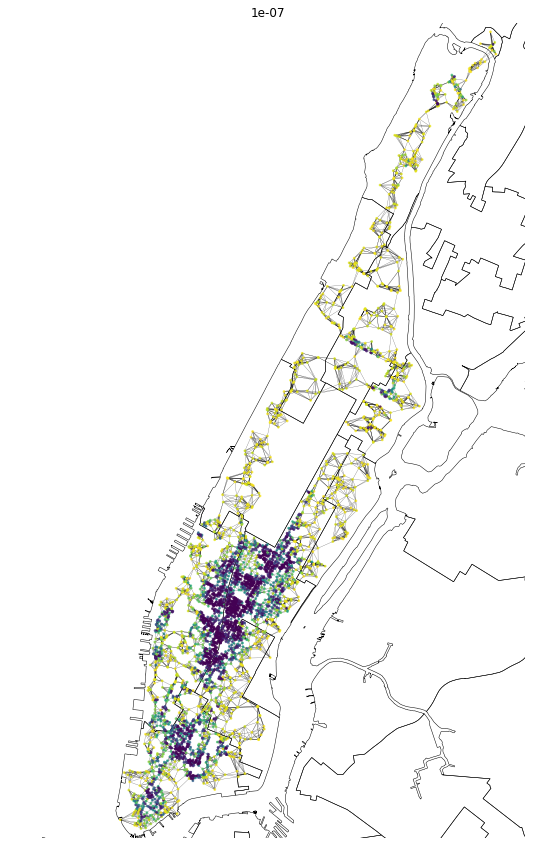

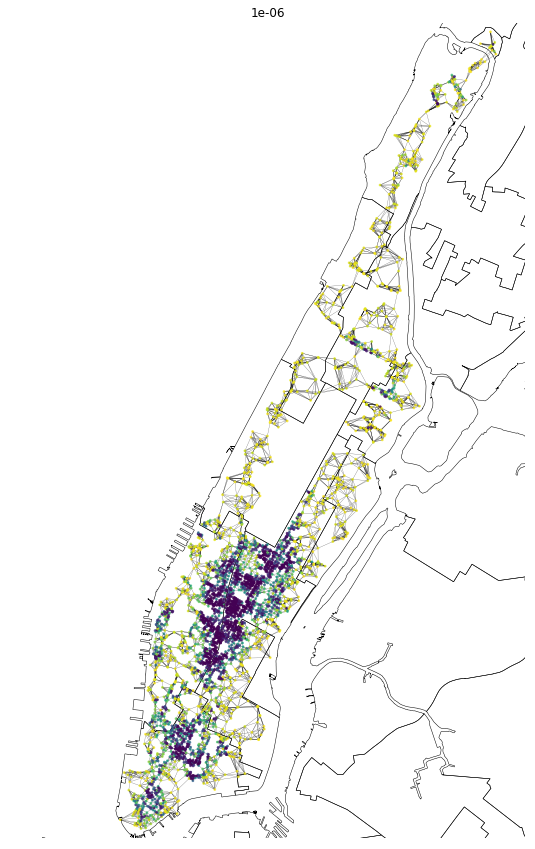

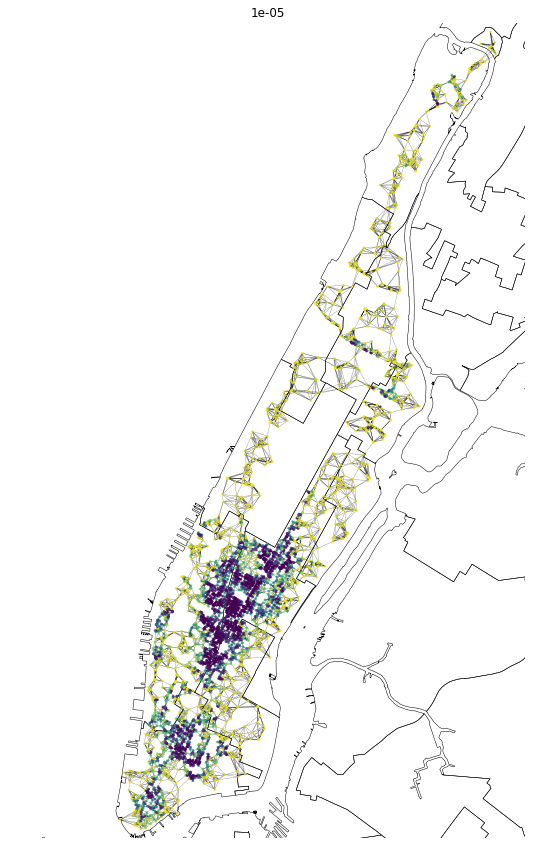

...

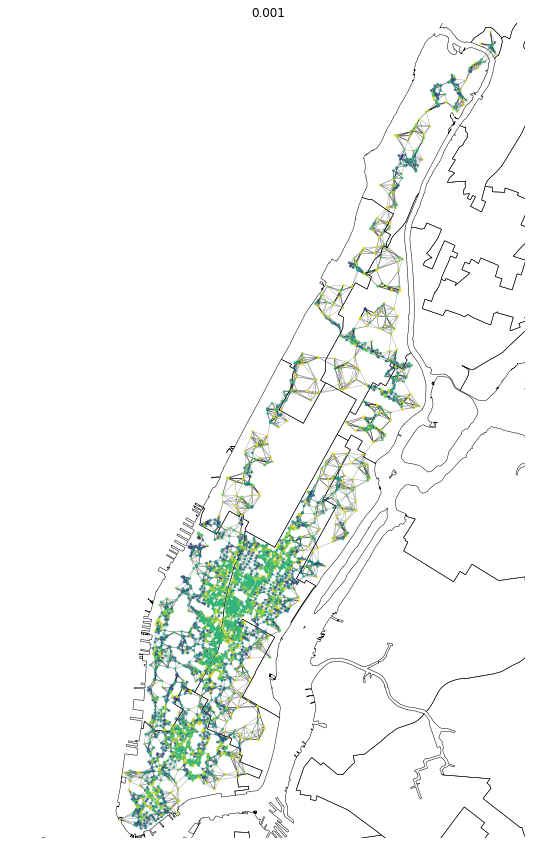

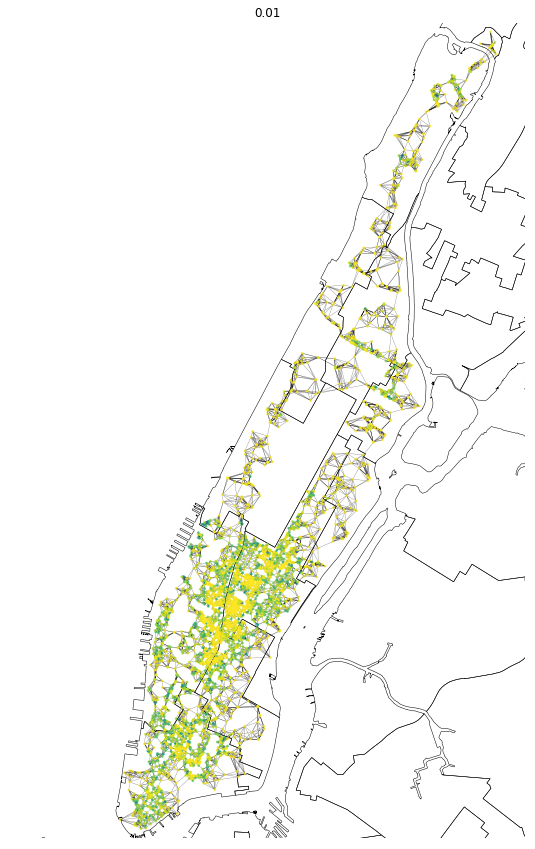

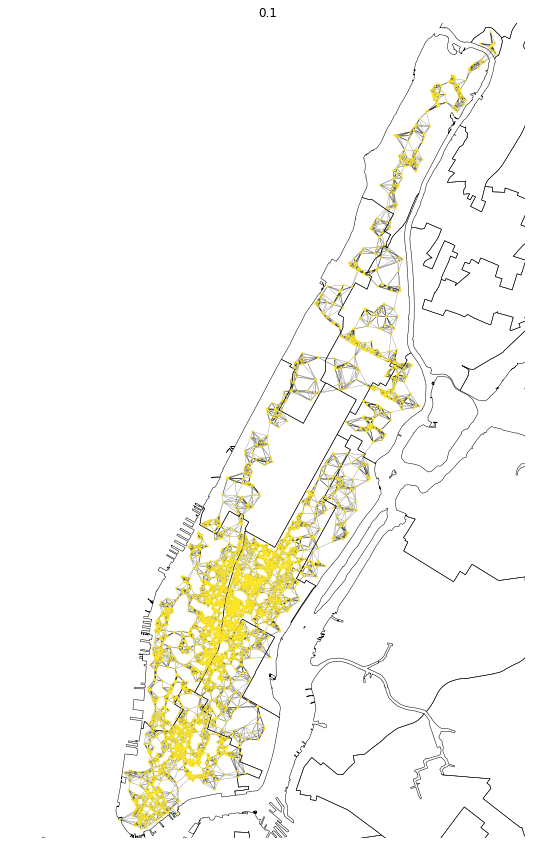

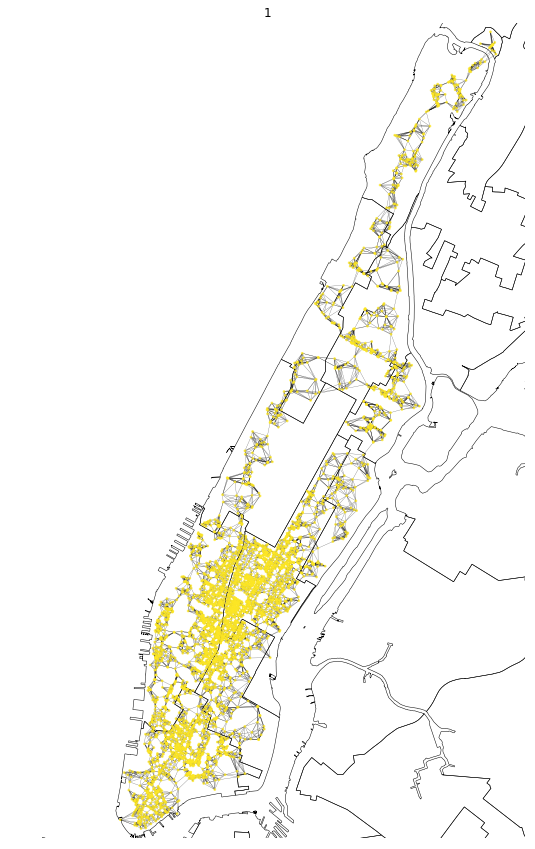

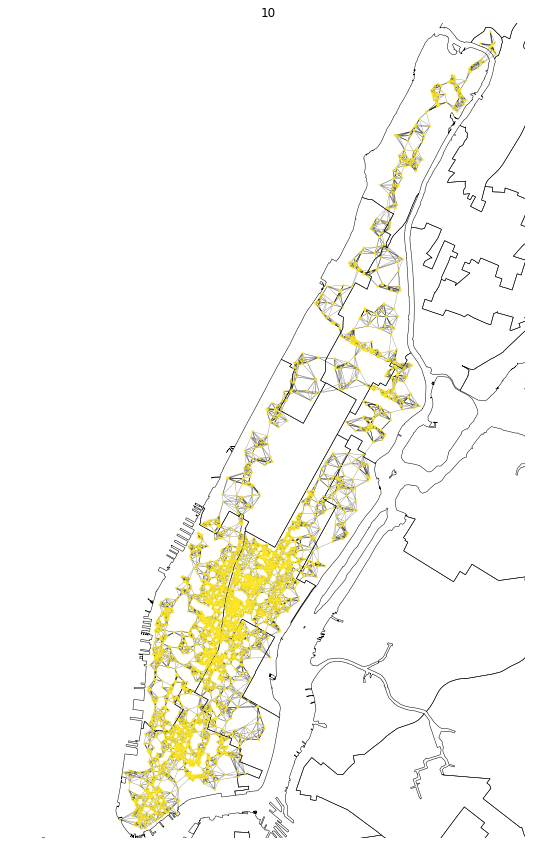

In [75]:
compare_to_node_s(rweighted_G, positions, rweighted_hks_dict, 26, ts)

## Unweighted

In [15]:
unweighted_edge_list = k_neighbors(man_lu5.loc[man_lu5.BoroCode != 5, 
                                               ['utm18_x', 'utm18_y']].values,
                                   weighted=0, k=8)
unweighted_G = nx.Graph()
unweighted_G.add_weighted_edges_from(unweighted_edge_list)
unweighted_hks_dict = hks_s(unweighted_G, ts, list(unweighted_G.nodes()), verbose=True, k=2000,
                          eigen_save_loc='eigen_saves/man_lu5_unweigted_pluto_knn')

/home/ubuntu/anaconda3/envs/mainEnv/lib/python3.6/site-packages/ipykernel_launcher.py:2: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  
/home/ubuntu/anaconda3/envs/mainEnv/lib/python3.6/site-packages/ipykernel_launcher.py:12: RuntimeWarning: invalid value encountered in sqrt
  if sys.path[0] == '':


Loading eigen values/vectors from file...
done! (0.03s)
Done with time 1e-08...
Done with time 1e-07...
Done with time 1e-06...
Done with time 1e-05...
Done with time 0.0001...
Done with time 0.001...
Done with time 0.01...
Done with time 0.1...
Done with time 1...
Done with time 10...
Finished in 3.36 seconds


0.0 0.30497870197173527 0.7533846136757472
0.0 0.24852711767997213 0.5615479849973957

0.0 0.30497834380319266 0.7533834606315595
0.0 0.24852687745834653 0.5615473273866479

0.0 0.30497476214117847 0.7533719302849837
0.0 0.24852447525264046 0.5615407513097389

0.0 0.30493894786201975 0.7532566363488233
0.0 0.24850045425060832 0.5614749935974458

0.0 0.3045810390647205 0.752104649423653
0.0 0.24826034971583433 0.5608177221365449

0.0 0.30102524671036535 0.7406795026578464
0.0 0.24586983557484673 0.5542755557627067

0.0 0.26769696453730646 0.6385411747892781
0.0 0.22300060788626277 0.49380631840417477

0.0 0.08354966840554975 0.22311451811680222
0.0 0.07853917765036145 0.20140048937516392

0.0 1.562204976655262e-06 1.1413839486236974e-05
0.0 1.5622025168852647e-06 1.1413774348848171e-05

0.0 1.3327459173522918e-49 2.917663394585966e-48
0.0 0.0 0.0



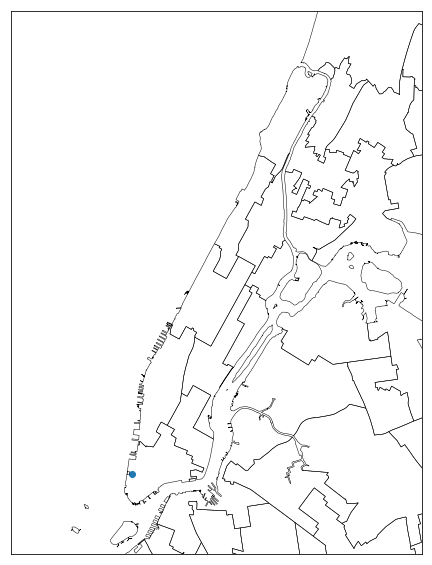

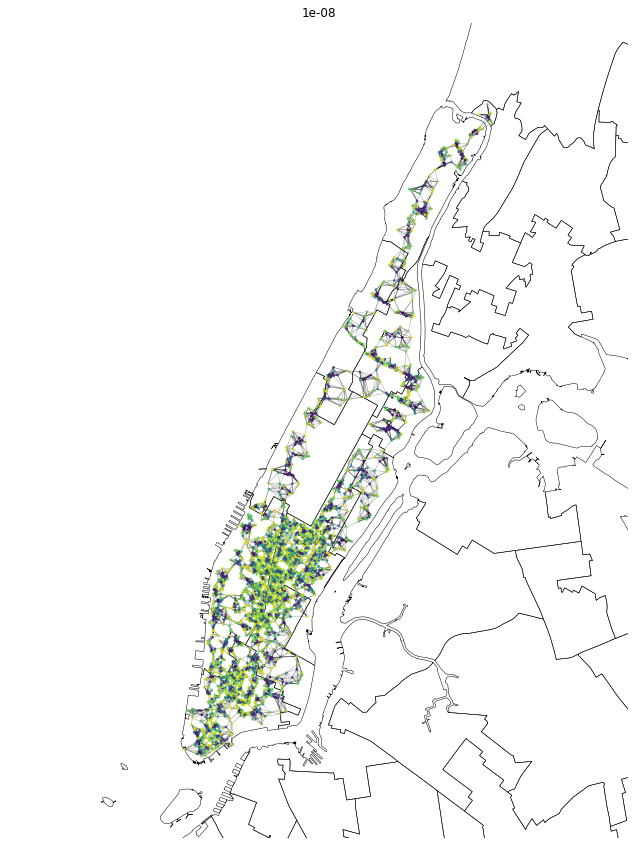

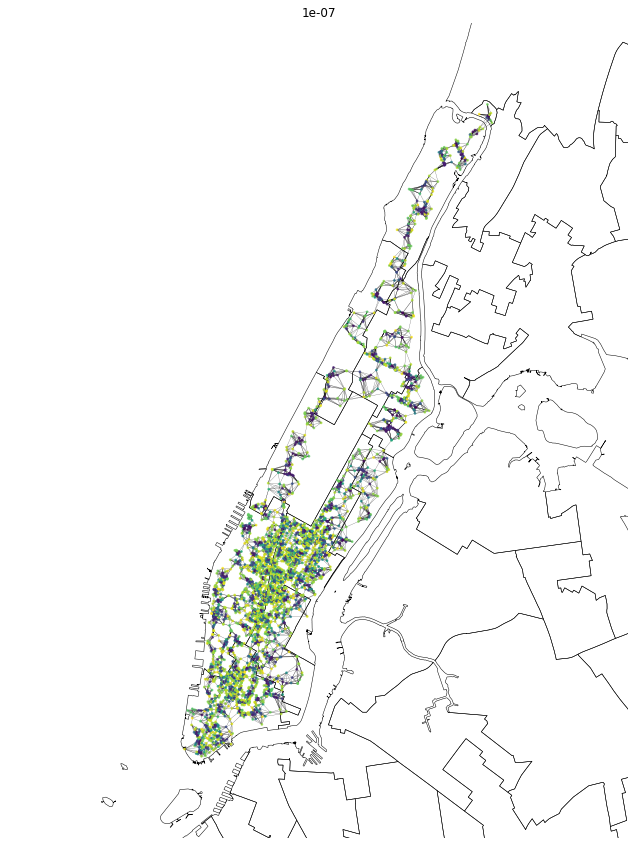

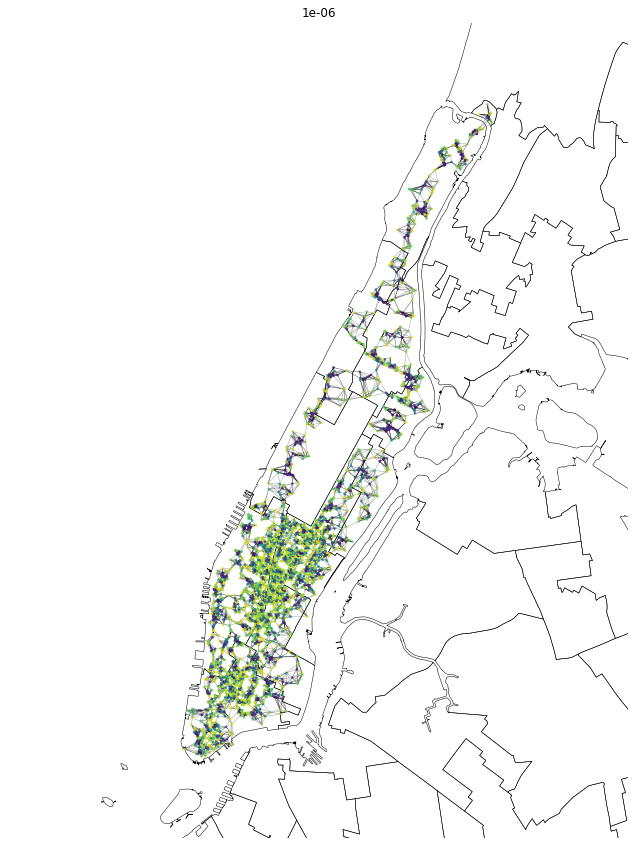

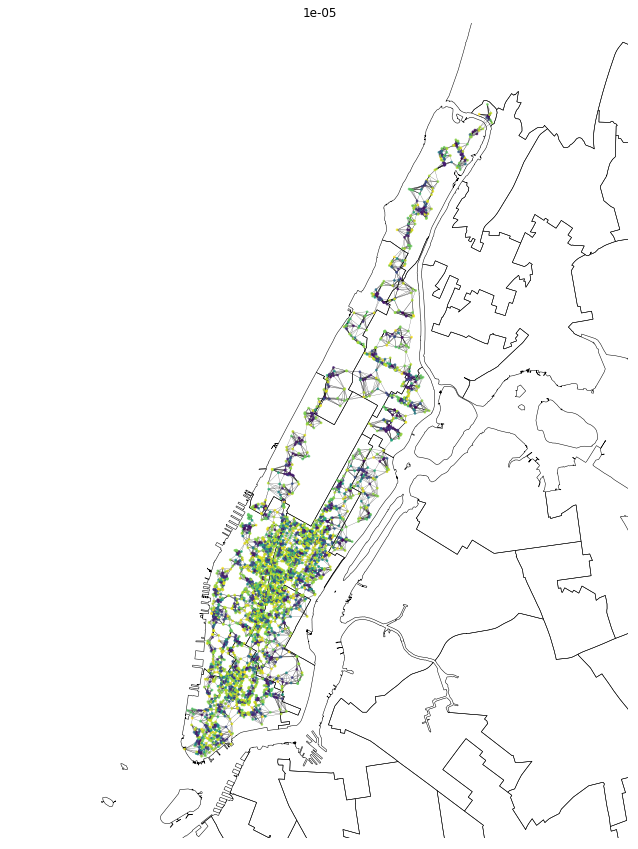

...

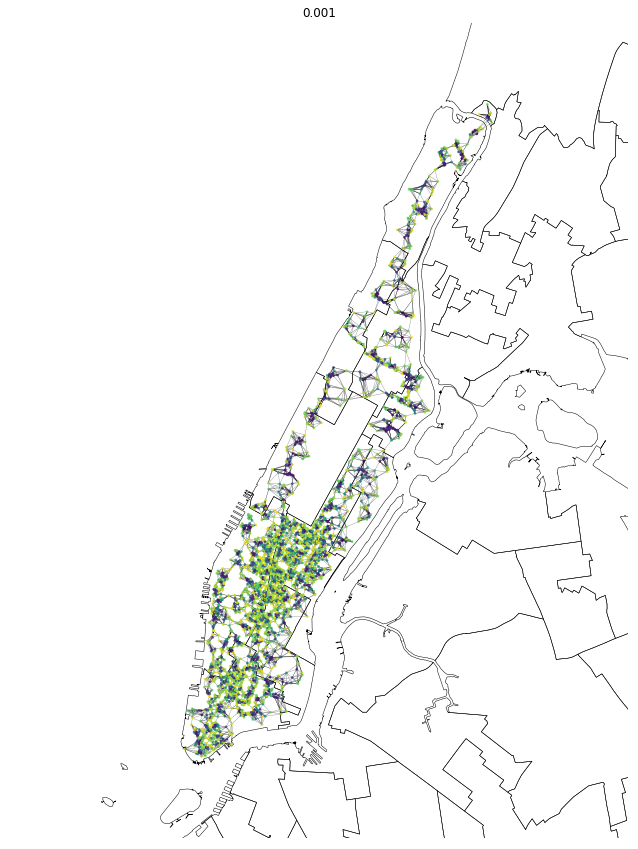

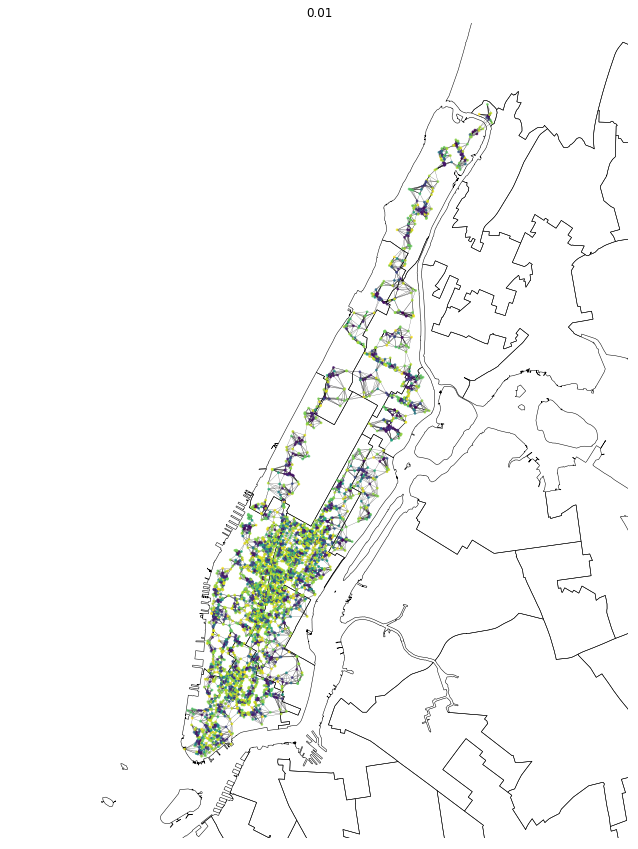

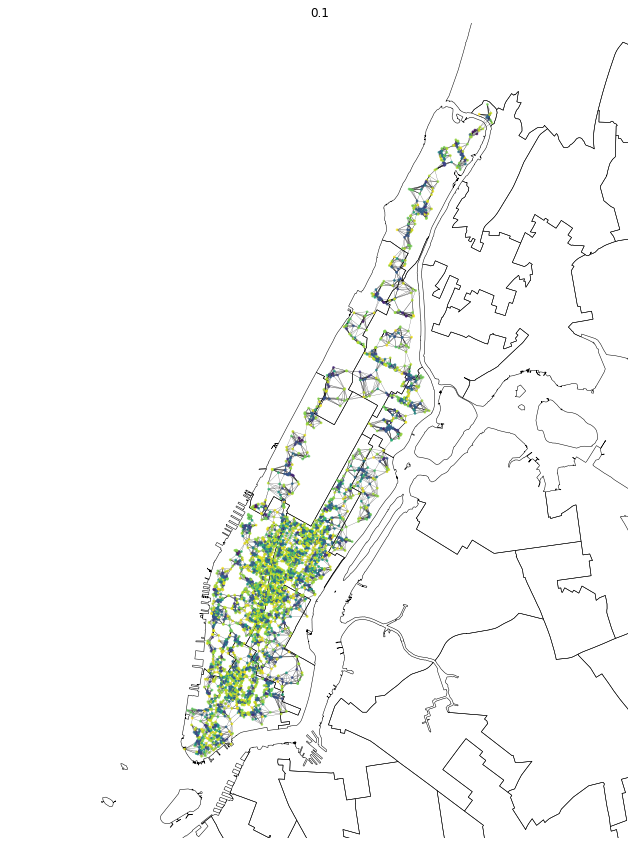

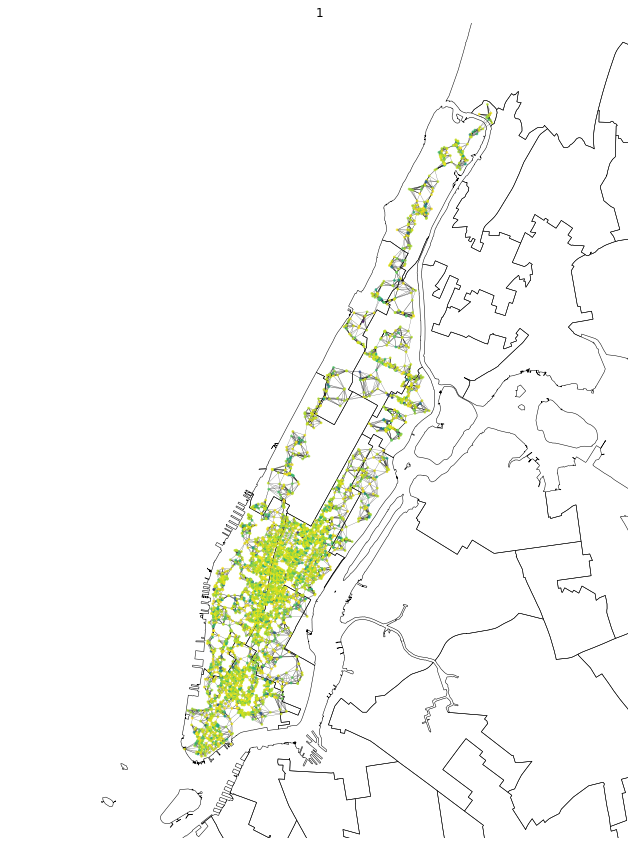

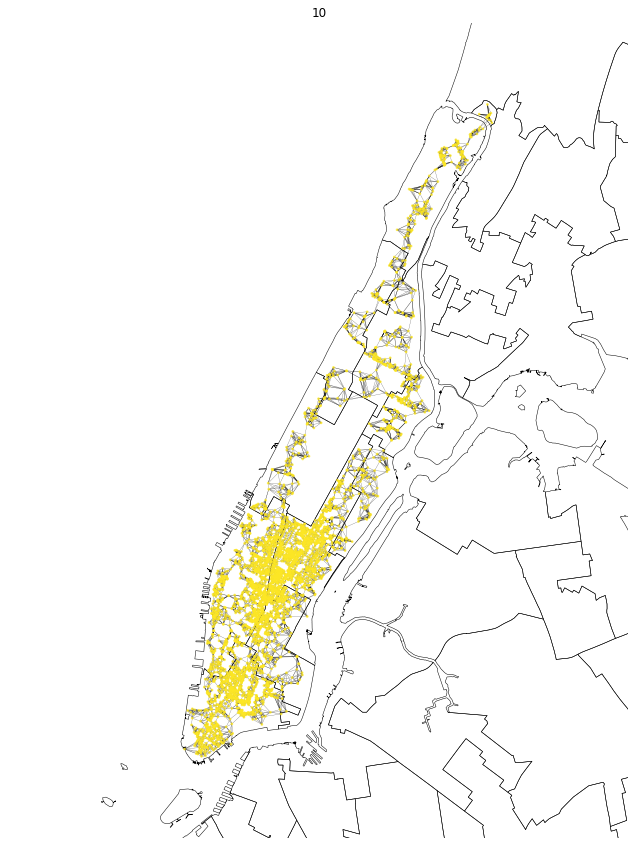

In [16]:
compare_to_node_s(unweighted_G, positions, unweighted_hks_dict, 26, ts)

0.0 0.24128664527950408 0.5229786414569354
0.0 0.2093818699548758 0.42066804982055456

0.0 0.07553859253255375 0.19123745648039686
0.0 0.07198063013906093 0.17499264621868332

0.0 1.6372941973368409e-06 1.172970098199883e-05
0.0 1.6372914033574966e-06 1.1729632189661427e-05

0.0 1.3792532994160681e-49 2.936250779934121e-48
0.0 0.0 0.0



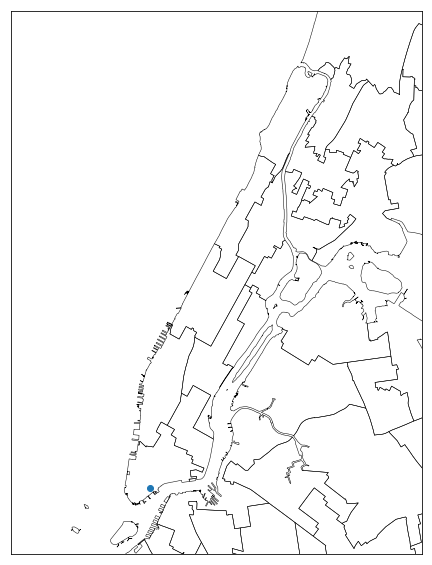

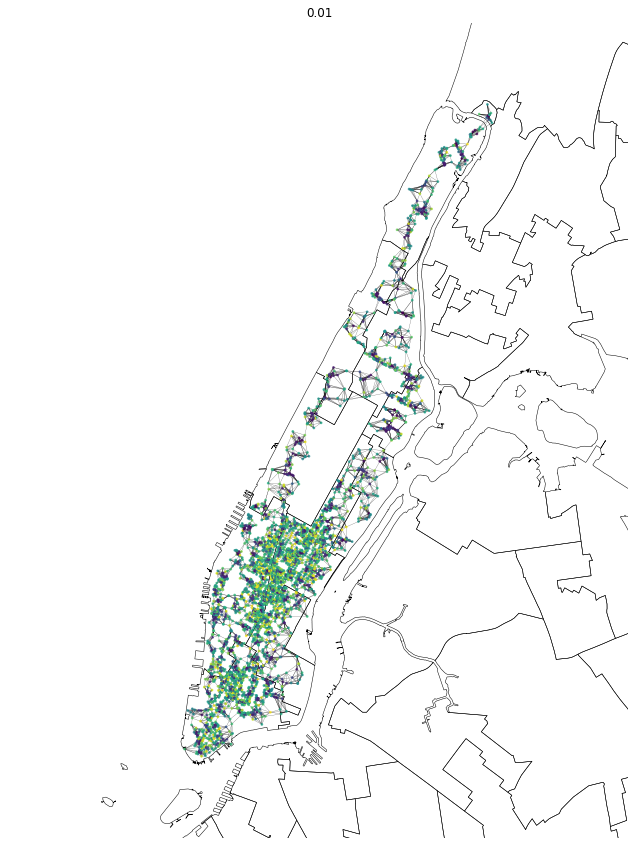

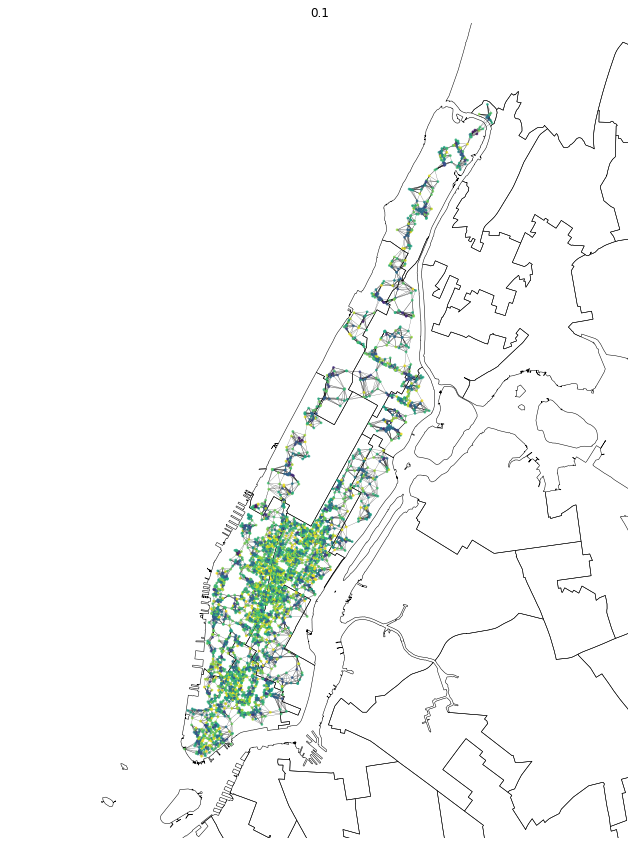

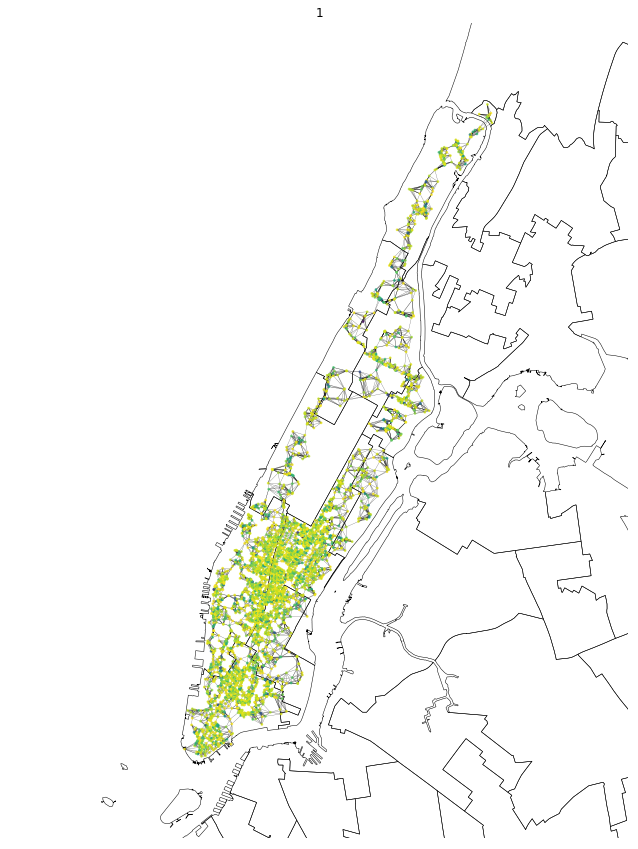

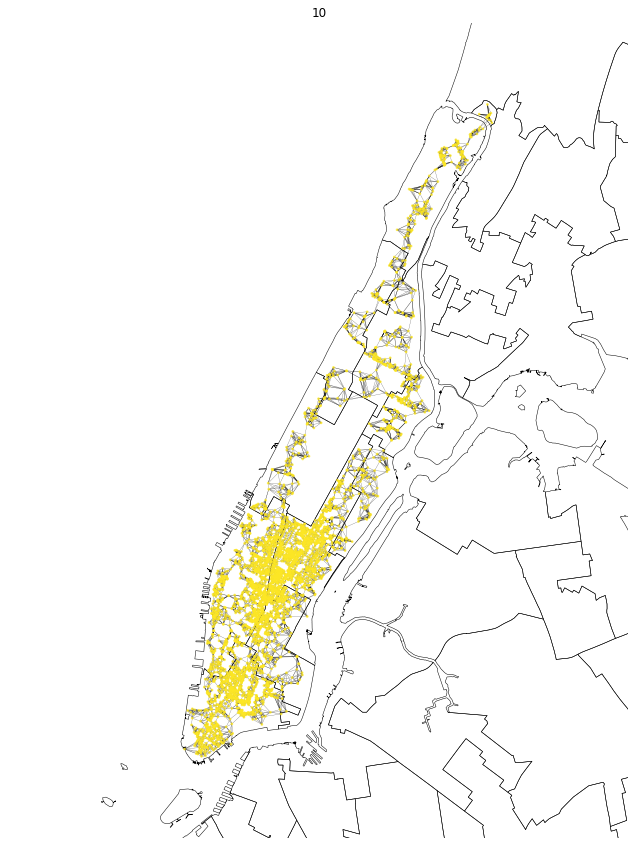

In [17]:
compare_to_node_s(unweighted_G, positions, unweighted_hks_dict, 150, ts[-4:])

In [68]:
def explore_components(G, hks_dict, t, tau):
    _, PD_points = persistence_diagram(G, f=hks_dict[t])
    plt.figure()
    plt.title(t)
    plot_PD(PD_points, tau=tau)
    C, _ = persistence_diagram(G, tau=tau, f=hks_dict[t])
    plt.show()
    plt.figure(figsize=(20, 20), dpi=300)
    m.readshapefile('../pluto/shapefiles/nycc', 'nyc-council')
    plot_segments(unweighted_G, C, positions, node_size=1, width=.05)
    

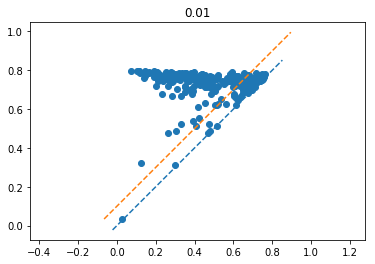

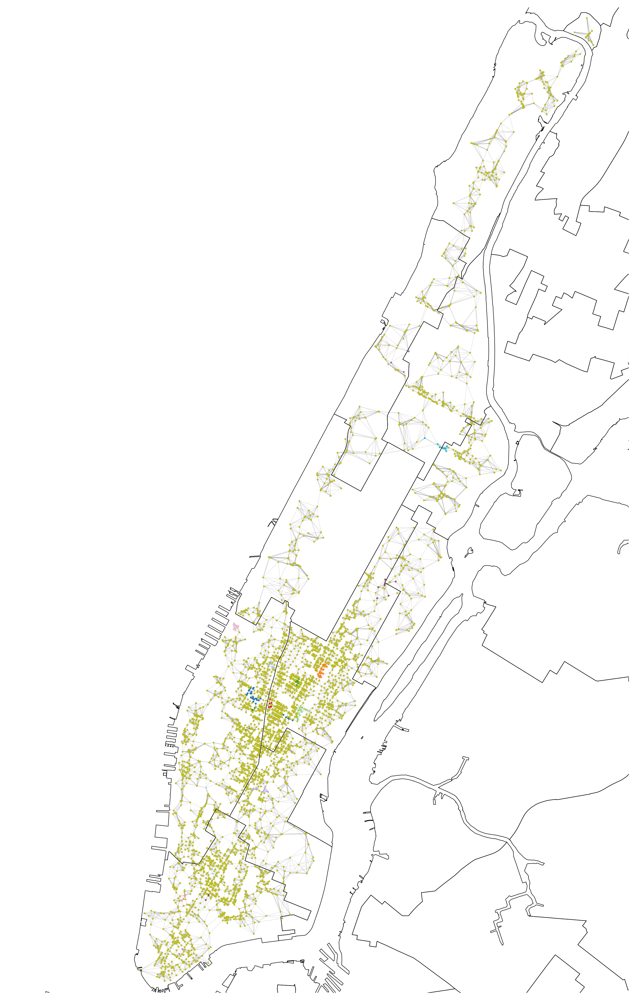

In [69]:
explore_components(unweighted_G, unweighted_hks_dict, t=.01, tau=.1)

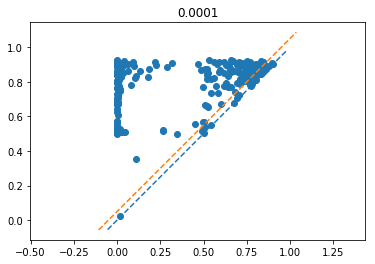

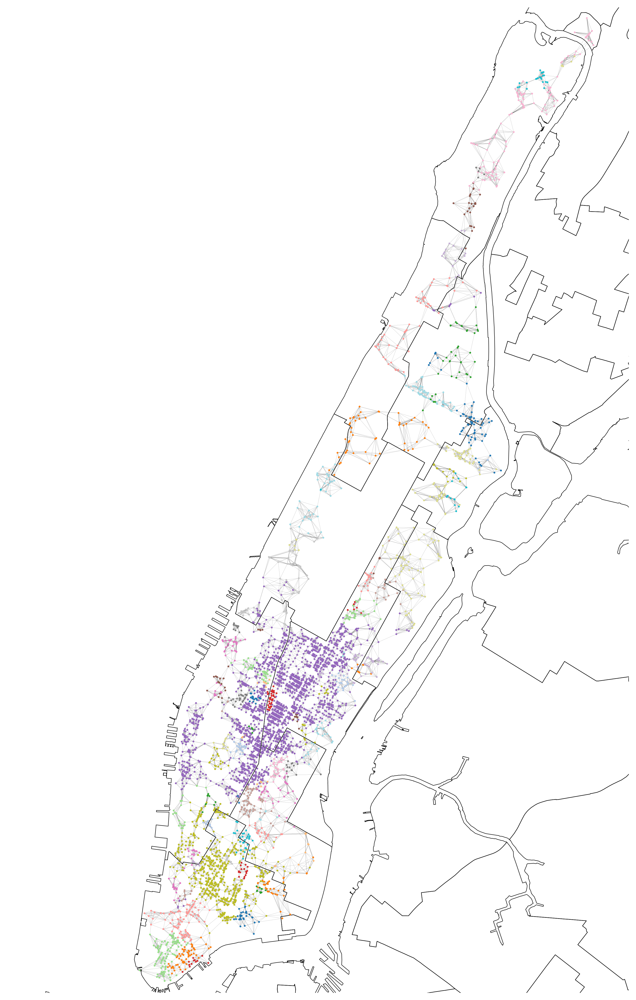

In [70]:
explore_components(weighted_G, weighted_hks_dict, t=.0001, tau=.05)

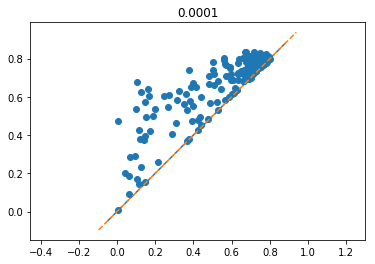

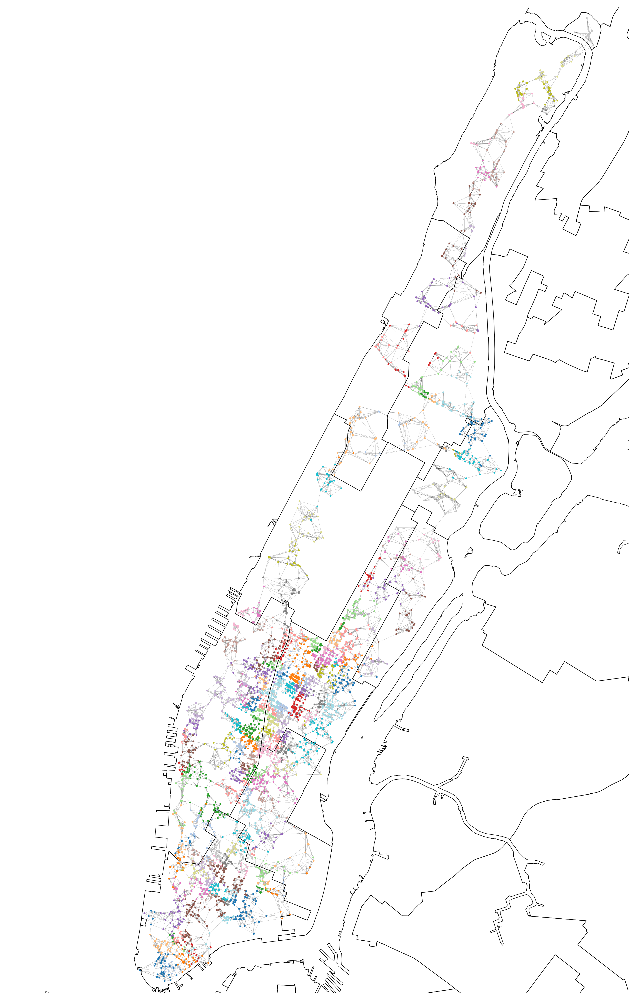

In [77]:
explore_components(rweighted_G, rweighted_hks_dict, t=.0001, tau=0)